# Analyzing lyrics from different music genres with universal sentence encoding

Applying Google’s Universal Sentence Encoder and Principal Component Analysis to identify similarities and differences across music genres

---

<img src="../assets/header.jpeg" style="width: 400px;">

# Project Aim
There are differences between the lyrics of different genres and we can quantify and measure this!

---




## Where do we get the data?
 - We will scrape lyrics from Musixmatch.com, a free website that hosts a tonne of accurate lyric content

## What kind of method/metric will allow us to quantify lyrical diversity in an intuitive way?
- We will represent lyrics using high dimensional vectors from Google’s Universal Sentence Encoder
- We will apply Principal Component Analysis (PCA) to reduce these high dimensional representations to n=1,2,3 dimensions

## How can we visualize this in a meaningful way?
- We will use Plotly and build a combination of simple plots and more sophisticated 2d and 3d scatter plots to see where there are similarities and differences in lyrics

# Libraries

In [1]:
#data / numbers
import pandas as pd
pd.options.plotting.backend = "plotly"
import numpy as np
import string
import itertools

#NLP
import spacy

#Tensorflow / Sentence Encoding
import tensorflow as tf
import tensorflow_hub as hub

#sklearn
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS 

#PCA
from sklearn.decomposition import PCA
import contractions as ct

#viz
import plotly
import plotly.graph_objs as go
import plotly.express as px

from plotly.offline import download_plotlyjs, iplot, plot
import chart_studio
import plotly.figure_factory as ff
import chart_studio.plotly as py


C:\Users\dlesha\anaconda3\envs\env_de\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning:

Blowfish has been deprecated



In [2]:
chart_studio.tools.set_credentials_file(username='kitsamho', api_key='JPuAu5Xtf7BhX43kDd4m')

## Helper Functions

In [3]:
chart_studio.tools.set_credentials_file(username='<USER NAME HERE>', api_key='<API KEY HERE>')

def savePlot(fig,filename):
        
    """Method to save Plotly figure to chart studio. Ensure you include your user and API key"""

    py.plot(fig, filename = filename, auto_open=True) #save Plotly figure to Chart Studio

    return print('Successfully saved as ',filename)

### Read in data..

In [4]:
df = pd.read_csv('../Lyric_data/lyrics.csv') #read in csv

### Get Genre Dictionary

In [5]:
#get DataFrame of unique artists
df_art_unique = df.drop_duplicates(subset='artist',keep='first')

In [6]:
#subset on artist and genre columns
df_art_unique = df_art_unique[['artist','genre']]

In [7]:
#make a genre dictionary
genre_dic = dict(zip(df_art_unique.artist,df_art_unique.genre))

In [8]:
genre_dic

{'Katy Perry': 'pop',
 'Ed Sheeran': 'pop',
 'Billie Eilish': 'pop',
 'Dua Lipa': 'pop',
 'Meshuggah': 'death-metal',
 'Deicide': 'death-metal',
 'Dismember': 'death-metal',
 'Children of Bodom': 'death-metal',
 'Immolation': 'death-metal',
 'Napalm Death': 'death-metal',
 'Decapitated': 'death-metal',
 'The Black Dahlia Murder': 'death-metal',
 'Obscura': 'death-metal',
 'Nile': 'death-metal',
 'Cryptopsy': 'death-metal',
 'Autopsy': 'death-metal',
 'Hypocrisy': 'death-metal',
 'Led Zeppelin': 'rock',
 'Rush': 'rock',
 'Kings of Leon': 'rock',
 'INXS': 'rock',
 'Eagles': 'rock',
 'Ray Charles': 'r&b/soul',
 'Al Green': 'r&b/soul',
 'Smokey Robinson': 'r&b/soul',
 'James Brown': 'r&b/soul',
 'The Righteous Brothers': 'r&b/soul',
 'Snoop Dogg': 'hip-hop/rap',
 'Cannibal Corpse': 'death-metal',
 'Kanye West': 'hip-hop/rap',
 'Nine Inch Nails': 'alternative',
 'AC DC': 'rock',
 'The Rolling Stones': 'rock',
 'Public Enemy': 'hip-hop/rap',
 'Alice In Chains': 'alternative',
 'Cradle of Fil

### Count word frequencies for each song

In [9]:
#get lyric frequencies for each song
df['lyric_count'] = df['lyrics'].map(lambda x: len(x.split()))

For plotting, we need to scale back the data in order for the traces to be the right size for the Plotly visualisations

In [10]:
#normalise lyric counts
norm = [float(i)/max(df.lyric_count) for i in df.lyric_count]

In [11]:
#get column for normalised data
df['lyric_count_norm'] = norm

In [12]:
#scale it up
df['lyric_count_norm'] = df['lyric_count_norm'].map(lambda x: x*55)

Let's look at what we have..

In [13]:
df.head(3)

,artist,song,lyrics,genre,lyric_count,lyric_count_norm
0,Katy Perry,The One That Got Away acoustic,"summer after high school, when we first met we...",pop,221,7.489217
1,Katy Perry,Who Am I Living For,"yeah, yeah, yeah i can feel a phoenix inside o...",pop,190,6.438694
2,Katy Perry,Daisies,told them your dreams and they all started lau...,pop,157,5.320394


### Get a unique artist code (for plotting)

We need to get some unique codes in order to be able to colour our traces

In [14]:
#get a unique code for each artists
artist_code = [i for i in range(len(df.artist.unique()))]

#get a dictionary
artist_dic = dict(zip(df.artist.unique(),artist_code))

#add artist code as column
df['artist_coding'] = df.artist.map(lambda x: artist_dic[x])

### Get a genre code (for plotting)

As above - but for genre

In [15]:
#get a unique code for each genre
genre_code = [i for i in range(len(df.genre.unique()))]

#get a dictionary
genre_code_dic = dict(zip(df.genre.unique(),genre_code))

#add genre code as column
df['genre_coding'] = df.genre.map(lambda x: genre_code_dic[x])


Let's look at what we have..

In [16]:
df.head(3)

,artist,song,lyrics,genre,lyric_count,lyric_count_norm,artist_coding,genre_coding
0,Katy Perry,The One That Got Away acoustic,"summer after high school, when we first met we...",pop,221,7.489217,0,0
1,Katy Perry,Who Am I Living For,"yeah, yeah, yeah i can feel a phoenix inside o...",pop,190,6.438694,0,0
2,Katy Perry,Daisies,told them your dreams and they all started lau...,pop,157,5.320394,0,0


# EDA

Before we start looking at sentence embeddings, let's have a little explore of what data we have

## Count of Genre

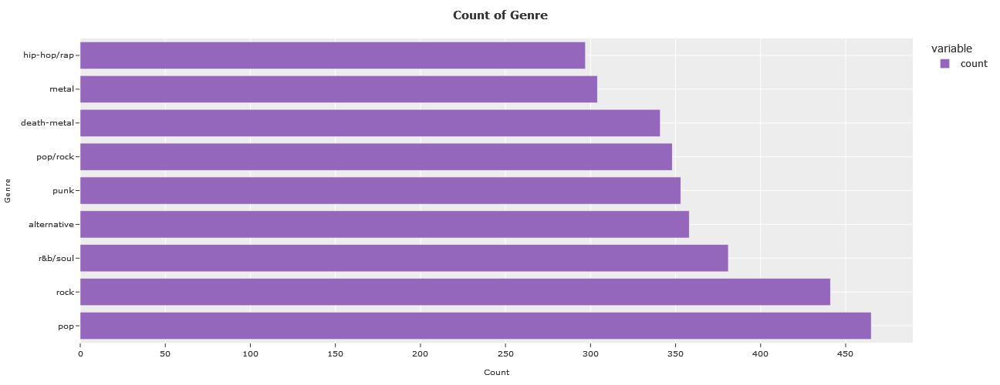

In [17]:
#plot genres
fig_genre = pd.DataFrame(df.genre.value_counts()).plot.barh(template='ggplot2')

#title parameters
title_param = dict(text='<b>Count of Genre</b><br></b>', 
                        font=dict(size=15))
#margin parameters
margin_param=dict(l=25,r=25,b=50,t=50,pad=0)

#update layout
fig_genre.update_layout(title=title_param,
                        margin = margin_param,
                        width=480,
                        height=500,        
                        xaxis = dict(title_text='Count',title_font = dict(size=10),tickfont=dict(size=10)),
                        yaxis = dict(title_text='Genre',title_font = dict(size=10),tickfont=dict(size=10)))

#change colours
fig_genre.update_traces(marker_color='rgb(148, 103, 189)')

#show plot
fig_genre.show()



## Count of Artist / Band

In [18]:
#subset on columns
df_suburst = df[['genre','artist','song']]

In [19]:
#create count column
df_suburst['count'] = 1

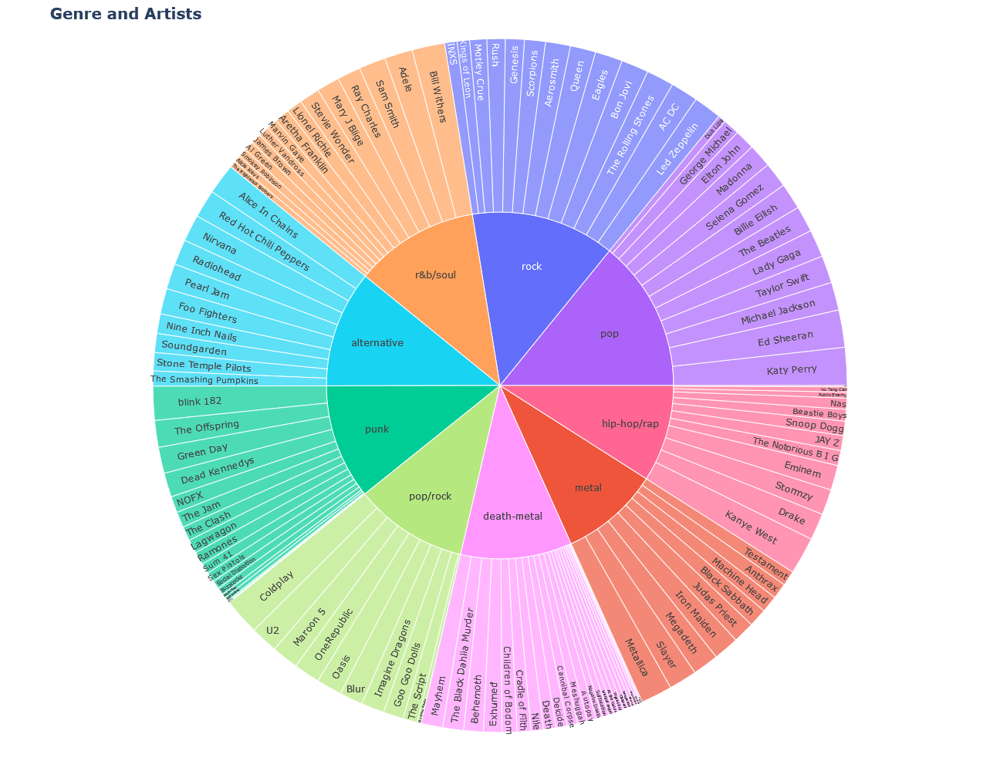

In [20]:
#create figure
fig_sunburst = px.sunburst(df_suburst, path=['genre', 'artist'], values='count',
                           color='genre',hover_name=None,hover_data=None)

#title parameters
title_param = dict(text='<b>Genre and Artists</b><br></b>', 
                   font=dict(size=20))

#margin parameters
margin_param=dict(l=25,r=25,b=50,t=50,pad=0)

#update layout
fig_sunburst.update_layout(title=title_param,
                           margin=margin_param,
                           width=1000,
                           height=1000)

#show plot
fig_sunburst.show()

## Distribution of Lyric Length, by genre

Let's look at the distribution of lyric length

In [21]:
#empty list
lyric_count_df = []

In [22]:
#loop through each unique genre
for i in df.genre.unique():
    
    #get subset of genres appended to list
    lyric_count_df.append(pd.DataFrame(df[df.genre == i]['lyric_count']))
    
#concat all DataFrames where each column is a genre
word_counts = pd.concat([i for i in lyric_count_df],axis=1)

In [23]:
#update columns
word_counts.columns = df.genre.unique()

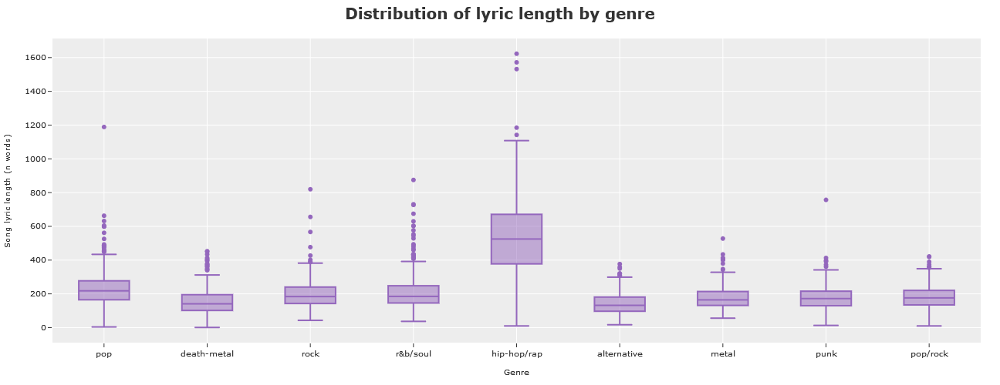

In [24]:
#plot lyric count distributon for each genre
fig_dist = word_counts.plot.box(template='ggplot2')

#title parameters
title_param = dict(text='<b>Distribution of lyric length by genre</b><br></b>', 
                        font=dict(size=20))

#margin parameters
margin_param=dict(l=25,r=25,b=50,t=50,pad=0)

#update layout
fig_dist.update_layout(title=title_param,
                       margin=margin_param,
                       width=900,
                       height=500,  
                       xaxis = dict(title_text='Genre',title_font = dict(size=10),tickfont=dict(size=10)),
                       yaxis = dict(title_text='Song lyric length (n words)',title_font = dict(size=10),tickfont=dict(size=10)))

#update colours
fig_dist.update_traces(marker_color='rgb(148, 103, 189)')

#show plot
fig_dist.show()



# PoS Analysis

In order to perform part of speech analysis we need use something like spaCy

In [25]:
#load spacy model
nlp = spacy.load('en_core_web_lg')

In [26]:
def pos(string,pos):
    
    """Returns any token that qualifies as a specific part of speech"""
    
    doc = nlp(string) #fit model
    
    return ' '.join(list(set([i.text for i in doc if i.pos_ == pos]))) #return any tokens that qualify

In [27]:
#get nouns
df['nouns'] = df.lyrics.map(lambda x: pos(x,'NOUN'))

In [28]:
#get verbs
df['verbs'] = df.lyrics.map(lambda x: pos(x,'VERB'))

In [29]:
#get adjectives
df['adjectives'] = df.lyrics.map(lambda x: pos(x,'ADJ'))

In [30]:
#get adverbs
df['adverbs'] = df.lyrics.map(lambda x: pos(x,'ADV'))

Let's inspect the new columns..

In [31]:
# subset on new columns
df.iloc[1566:1568][df.columns[8:]]

,nouns,verbs,adjectives,adverbs
1566,midnight styrofoam world motel innocence chang...,take turning die got try saw wear busted end l...,second old same full graceless crazy fast,away still around round rather even just
1567,sinners up change sinner apology miracles tomo...,goes call hear say born does shine got paved s...,hungry bitter cynical givin guilty innocent ho...,differently


A function that can count the most common PoS will be helpful

In [32]:
def mostcommonTokens(data,additional_stopwords = [],token=1):
    
    """Returns a DataFrame of the most common n (arg)tokens in a string. Excludes stop words. Additional
    stop words can be added"""
    
    #add any new stop words to default stopword list
    add_stop_words = ENGLISH_STOP_WORDS.union(additional_stopwords)
    add_stop_words = list(add_stop_words)
    
    #instantiate count vectorizer and specify tokens
    vect = CountVectorizer(stop_words=add_stop_words, ngram_range= (token,token))

    #fit vectorizer
    X = vect.fit_transform(data)
    
    #get word counts as DataFrame
    word_counts = pd.DataFrame(np.asarray(X.sum(axis=0))[0],vect.get_feature_names_out(),columns=['count'])
    
    #sort by count
    word_counts = word_counts.sort_values(by='count', ascending=False)

    return word_counts


*Let's look at the top 10 words in the whole lyric corpus

In [33]:
#call the function on one gram
mostcommonTokens(df.lyrics,token=1).head(10)

,count
like,4182
know,3789
just,3609
yeah,3488
love,3486
got,3466
oh,3465
want,2895
time,2220
let,1963


We can integrate the mostcommonTokens function with Treemap visualisations to make the analysis clearer

In [34]:
def genreMap(df,pos,n=100):
    
    """Visualisation function. Returns a treemap of the most common n tokens that qualify as a part of speech"""
    
    #list to populate subset DataFrame's
    all_df = []

    #loop through unique genres
    for i in df.genre.unique():

        #get most common tokens for part of speech
        temp_df = mostcommonTokens(df[df['genre'] == i][pos]).head(n)
        
        #add column for current genre
        temp_df['genre'] = i

        #append DataFrame to list
        all_df.append(temp_df)

    #concatenate all DataFrame's
    all_df = pd.concat([i for i in all_df])

    #reset index
    all_df.reset_index(drop=False,inplace=True)

    #column labels
    all_df.columns = ['word','count','genre']

    # in order to have a single root node add 'all genres'
    all_df["all genres"] = "all genres" 

    #create plotly treemap figure
    fig = px.treemap(all_df, path=['all genres', 'genre', 'word'], values='count',)
    
    #title parameters
    title_param = dict(text='<b>Most Common Nouns, by genre</b><br>spaCy used for classifying PoS</b>', 
                        font=dict(size=20))
    
    #update layout
    fig.update_layout(title=title_param,
                    font= dict(family='Helvetica',size=10),
                    width=900,
                    height=900,
                    autosize=False,
                    margin=dict(l=40,r=40,b=85,t=100,pad=0,))
        
    #show plot
    fig.show()
    
    return fig

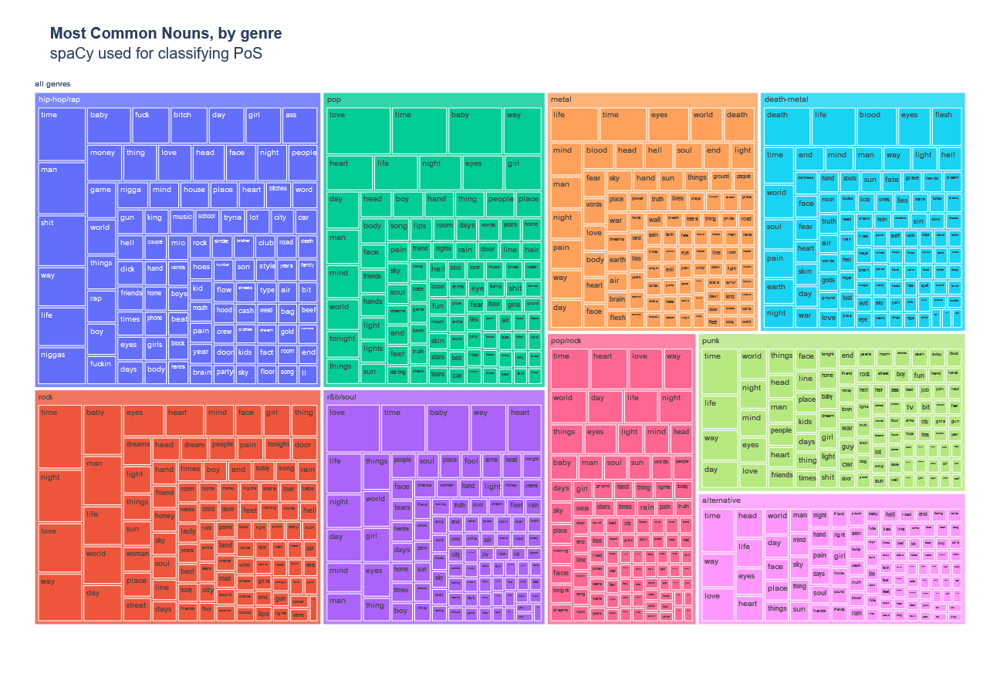

In [35]:
fig_nouns = genreMap(df,'nouns')

# Load Universal Sentence Encoder

In order to get embeddings - we need to load the universal sentence encoder.

In [36]:
#get universal sentence encoder
USE = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [37]:
def getUSEEmbed(_string,USE = USE):
    
    """Function takes a string argument and returns its high dimensional vector from USE"""
    
    return np.array(USE([_string])[0])

In [38]:
#call function to get embedding
example = getUSEEmbed('Hello how are you?')

Inspect shape of the vector

In [39]:
example.shape

(512,)

We can assess similarity by looking at **cosine similarity** of the vectors..

The cosine similarity of two high dimensional vectors representing SIMILAR sentences should be high.. 

For sentences that are DIFFERENT, the cosine similarity should be low..



In [40]:
#some example sentences
example_sentences = ["The weather is going to be really warm today",
                     
                     "Today is going to be the sunniest day of the year",
                     
                     "I like my eggs sunny side up",
                     
                     "Breakfast is my favourite meal"]


In [41]:
#get embeddings for each example sentence
embed = [getUSEEmbed(i) for i in example_sentences]

In [42]:
#set up a dictionary where each sentece is a key and its value is its 512 vector embedding
dic_ = dict(zip(example_sentences,embed))

In [43]:
#let's find all the unique pairwise sentence combinations
combo = [list(i) for i in itertools.combinations(example_sentences, 2)]

In [44]:
def cosineSimilarity(vec_x,vec_y):
    
    """Function returns pairwise cosine similarity of two vector arguments"""
    
    return cosine_similarity([vec_x],[vec_y])[0][0]

Let's make a DataFrame that maps the cosine similarity for each unique sentence pair

In [45]:
#empty list for data
cs = []

#lop through each unique sentence pairing
for i in range(len(combo)):
    
    #get cosine similarity for each
    cs_ = cosineSimilarity(dic_[combo[i][0]],dic_[combo[i][1]])
    
    #append data to list
    cs.append((combo[i][0],combo[i][1],cs_))



In [46]:
#construct DataFrame
cs_df = pd.DataFrame(cs,columns=['sent_1','sent_2','cosine_similarity']).\
                    sort_values(by='cosine_similarity',ascending=False)

Let's look at the data..

Sentences that are similar have higher cosine similarity. This mean the vectors that represent these sentences are similar. That's really impressive!

In [47]:
cs_df

,sent_1,sent_2,cosine_similarity
0,The weather is going to be really warm today,Today is going to be the sunniest day of the year,0.519781
5,I like my eggs sunny side up,Breakfast is my favourite meal,0.416550
1,The weather is going to be really warm today,I like my eggs sunny side up,0.150719
3,Today is going to be the sunniest day of the year,I like my eggs sunny side up,0.146834
2,The weather is going to be really warm today,Breakfast is my favourite meal,0.139814
4,Today is going to be the sunniest day of the year,Breakfast is my favourite meal,0.137269


# USE Embeddings

Let's apply this technique to get embeddings for each of our songs.

In [48]:
#get USE embeddings for each song
df_embed = pd.DataFrame([getUSEEmbed(df.lyrics[i]) for i in range(df.shape[0])],\
                        index=[df.song[i] for i in range(df.shape[0])])

The lyrics of each song are represented as high dimensional vectors

In [49]:
df_embed.head(20)

,0,1,2,3,4,5,6,7,8,9,...,502,503,504,505,506,507,508,509,510,511
The One That Got Away acoustic,0.002838,-0.070699,0.071667,-0.005688,-0.057787,0.047787,-0.016360,-0.000469,-0.010588,-0.067344,...,-0.027103,-0.071852,-0.057404,-0.037819,-0.037901,0.043712,0.054640,-0.005483,-0.063760,0.025022
Who Am I Living For,-0.031676,-0.070214,0.067109,0.056683,0.010059,-0.058094,0.067779,-0.003515,0.041439,0.002041,...,-0.051337,-0.075294,0.007388,-0.026499,0.047676,0.012287,-0.045737,0.042120,-0.058688,0.057825
Daisies,-0.019871,-0.064819,0.038741,-0.032296,-0.001486,-0.033481,0.018059,-0.050387,-0.071577,-0.026761,...,-0.049478,-0.071203,0.044725,-0.008223,-0.063310,0.021955,-0.006814,0.013424,0.039509,0.031160
Witness,-0.008359,-0.049523,0.028044,0.038328,0.023133,-0.051378,0.008220,0.024629,0.046135,-0.062097,...,-0.054346,-0.070911,-0.041959,-0.037329,-0.039399,-0.018347,0.059835,0.037758,-0.045419,0.036411
Starstrukk,-0.040732,-0.022921,-0.021097,0.031555,-0.012433,0.054626,0.027091,0.001238,-0.085674,0.016317,...,-0.044179,-0.089027,0.032942,0.027877,-0.007560,0.070868,-0.024025,-0.015801,-0.026928,0.050967
Birthday,-0.021830,-0.070009,0.070492,0.061501,-0.046353,-0.025191,-0.069344,-0.001109,-0.002270,-0.041536,...,0.019940,-0.070653,0.035514,0.001723,-0.032653,0.035728,-0.021292,-0.030192,-0.061660,-0.011480
Save As Draft,-0.008242,-0.081798,-0.032451,0.062998,-0.054732,-0.010438,0.014660,-0.023817,0.040707,0.044820,...,-0.003876,-0.089517,-0.000484,0.018639,-0.013337,0.034465,-0.069218,0.050370,-0.046481,-0.035127
Walking on Air,0.012115,-0.043124,0.064730,0.030730,-0.049601,-0.039745,0.008400,-0.042047,0.036333,0.058454,...,-0.059874,-0.064360,0.009974,-0.001454,-0.003591,0.036791,0.005627,0.028063,-0.041480,0.053257
Firework,-0.017788,-0.064830,0.069706,0.049199,-0.017233,-0.048790,-0.028262,-0.004870,-0.016336,0.042431,...,0.007052,-0.071265,-0.021955,0.010146,-0.044114,0.027493,-0.064885,0.009179,-0.044942,0.034161
Unconditionally,-0.019738,-0.070386,0.007292,0.044800,-0.013142,-0.007561,0.003281,0.052355,-0.043396,0.047355,...,-0.044312,-0.070679,0.020346,0.052851,0.007925,0.014083,-0.023213,0.028777,-0.055213,0.022267


Let's use another data reduction technique - Principal Component Analysis, to reduce the dimensionality of these embeddings whilst retaining as much variance as possible.

In [50]:
def MusixmatchPCA(df,df_embedding,n_components):
    
    """Function uses PCA to reduce dimensionality of the USE embeddings for each song
    returning a DataFrame with either 1,2,3 PC's"""
    
    cols = df_embedding.index
    
    embeddings = df_embedding.iloc[:, 1:] #subset on embeddings only
    
    pca = PCA(n_components=n_components) #instantiate PCA

    pca.fit(embeddings) #fit the embeddings

    new_values = pca.transform(embeddings) #transform / reduce data
    
    #let's see how much variance can be explained
    print(pca.explained_variance_ratio_.cumsum()) 
    
    #option to have 1,2 columns / components
    if n_components == 2:
        
        columns = ['pca_x','pca_y']
        
    elif n_components == 3:
        
        columns = ['pca_x','pca_y','pca_z']
        
    else: 
        columns = ['pc']
    
    df_reduced = pd.DataFrame(new_values,index=cols) #get new DataFrame
    
    df_reduced.columns = columns
    
    if n_components == 1:
        
        df_reduced.sort_values(by='pc',ascending=False,inplace=True)
    
    #merges PCA DataFrame on original DataFrame
    df_merge = pd.merge(df,df_reduced,how='inner',left_on='song',right_on=df_reduced.index)
    
    return df_merge #returns merged DataFrame

As we can see, the cumulative variance that is explained when we reduce 512 dimensions down to n = 1,2,3 is pretty poor. Let's continue with this for now and see if we still get useful results. 

In [51]:
pc_1 = MusixmatchPCA(df,df_embed,n_components=1)
pc_2 = MusixmatchPCA(df,df_embed,n_components=2)
pc_3 = MusixmatchPCA(df,df_embed,n_components=3)

[0.07292866]
[0.07292872 0.11527752]
[0.07292864 0.11527737 0.14892861]


Let's do some grouping to explore which artists have lyrics that are most similar to each other

As we can see - even with one component, artists from genres tend to cluster together. Death metal, heavy metal and rock differ slighty from one another but vastly different to pop and soul. This makes sense!

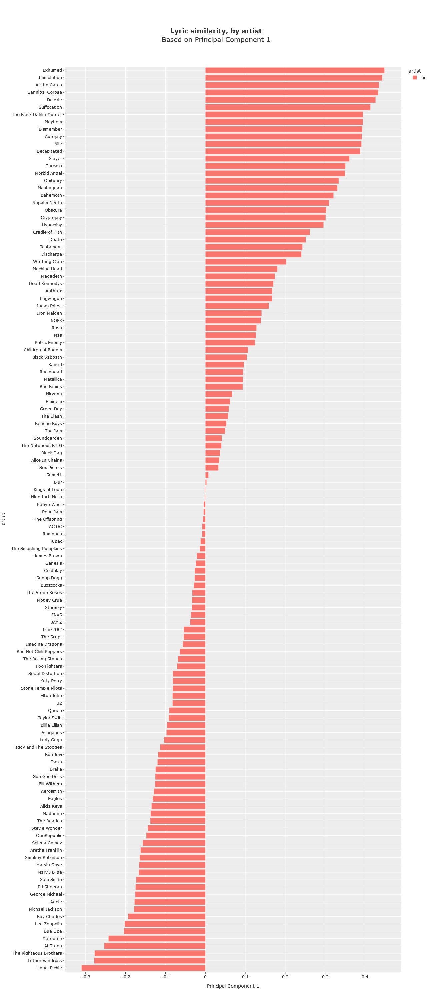

In [52]:
#DataFrame of grouped data
pc1_group = pd.DataFrame(pc_1.groupby('artist')['pc'].mean())

#sort values by principal component and plot data
fig_lyric_sim_art = pc1_group.sort_values(by='pc').plot.barh(labels=dict(variable="artist", value="PC"),
                               template='ggplot2')

#title parameters
title_param = dict(text='<b>Lyric similarity, by artist</b><br>Based on Principal Component 1</b>', 
                        font=dict(size=20))

#margin parameters
margin_param=dict(l=40,r=40,b=85,t=200,pad=0)

#update figure
fig_lyric_sim_art.update_layout(title=title_param,
                                width=1000,
                                height=3000,
                                margin = margin_param,
                                xaxis = dict(title='Principal Component 1'))
#show figure
fig_lyric_sim_art.show()


 Let's look at the same analysis but grouped by genres.

This confirms what we found above, the lyrics in genres cluster into groups that make sense.

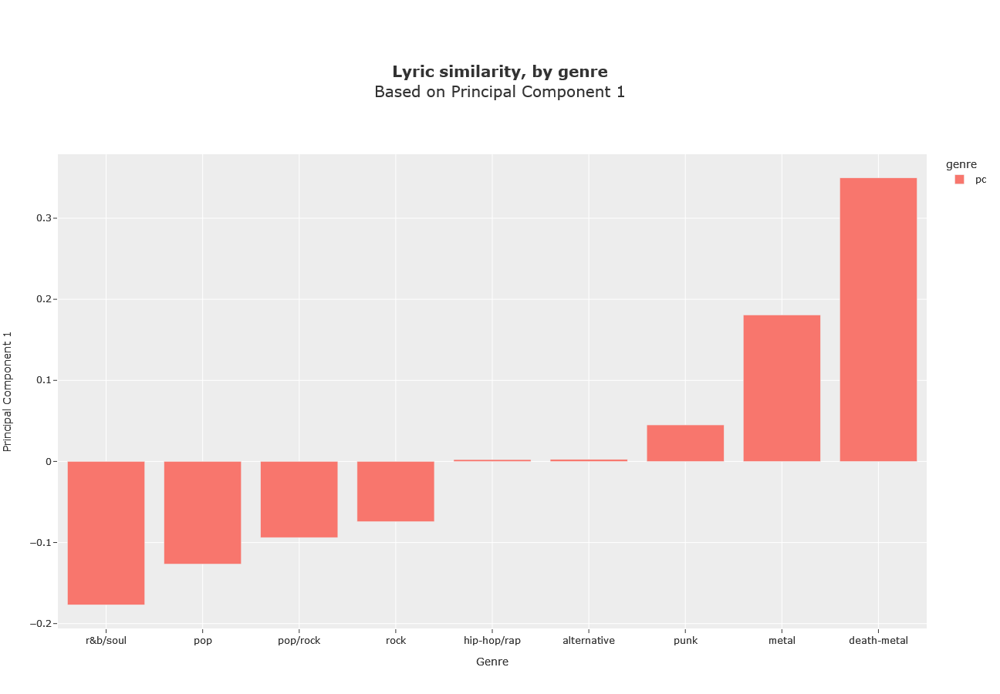

In [53]:
#DataFrame of grouped data
pc1_group = pd.DataFrame(pc_1.groupby('genre')['pc'].mean())

#sort values by principal component and plot data
fig_lyric_sim_genre = pc1_group.sort_values(by='pc').plot.bar(labels=dict(variable="genre", value="PC"),\
                               template='ggplot2')

#title parameters
title_param = dict(text='<b>Lyric similarity, by genre</b><br>Based on Principal Component 1</b>', 
                        font=dict(size=20))

#margin parameters
margin_param=dict(l=40,r=40,b=85,t=200,pad=0)

#update figure
fig_lyric_sim_genre.update_layout(
                      title=title_param,
                      width=1000,
                      height=900,
                      margin=margin_param,
                      xaxis = dict(title='Genre'),
                      yaxis = dict(title='Principal Component 1'))
#show figure
fig_lyric_sim_genre.show()


Let's make a more sophisticated visualisation that uses scatter plots to show this data by song. 

We can look at this in two dimensions (PC1,PC2) but also in three dimensions (PC1,PC2,PC3)

# Plotting

In [54]:
def Musixmatch_scatPlot(df,df_embed,n_components=2):
    
    """Comprehensive function that adds components to a scatter plot"""
    
    df = MusixmatchPCA(df,df_embed,n_components) #gets PCA
             
    fig = go.Figure() #instantiate Ploty.go object

    genres = df.genre.unique() #get unique genres     
    
    for i in range(len(genres)): #loop through genres

        df_mask = df[df.genre == genres[i]] #subset on genre
        
        df_mask['artist_song'] = df_mask['artist']+' // '+df_mask['song'] #new labels for traces
             
        if n_components == 2:
            
            #add traces for 2d - several formatting options for hover text, and marker size
            fig.add_trace(go.Scatter(
                          x=df_mask['pca_x'],
                          y=df_mask['pca_y'],
                          name=genres[i],
                          text=df_mask['artist_song'],
                          mode='markers',hoverinfo='text',
                          marker={'size':df_mask.lyric_count_norm}))
        
        else:
            #add traces for 3d - several formatting options for hover text, and marker size
            fig.add_trace(go.Scatter3d(
                          x=df_mask['pca_x'],
                          y=df_mask['pca_y'],
                          z=df_mask['pca_z'],
                          name=genres[i],
                          text=df_mask['artist_song'],
                          mode='markers',hoverinfo='text',
                          marker={'size':df_mask.lyric_count_norm}))
    # axis parameters
    axis_x_param=dict(showline=True, 
                      zeroline=True,
                      showgrid=True,
                      showticklabels=True,
                      title='Principal Component 1')
    # axis parameters
    axis_y_param=dict(showline=True, 
                      zeroline=True,
                      showgrid=True,
                      showticklabels=True,
                      title='Principal Component 2')
    
    # legend parameters
    legend_param= dict(bgcolor=None,
                       bordercolor = None,
                       borderwidth = None,
                       font = dict(family='Open Sans',size=15,color=None),
                       orientation='v',
                       itemsizing='constant',
                       title=dict(text='Genres (clickable!)',
                                  font=dict(family='Open Sans',size=20,color=None),
                                  side='top'),)
    # margin parameters
    margin_param=dict(l=40,r=40,b=85,t=200,pad=0)
    
    # title parameters
    title_param = dict(text='<b>Similarities and differences in song lyrics by genre</b>\
    <br>Universal sentence encodings and dimensionality reduction - trace size represents lyric count.', 
                        font=dict(size=20))
    
    #update layout
    fig.update_layout(legend= legend_param,
                      title=title_param,
                      width=1000,
                      height=1000,
                      showlegend=True,
                      xaxis=axis_x_param,
                      yaxis=axis_y_param,
                      margin=margin_param,)

    fig.show()    
    return fig

[0.0729287  0.11527751]


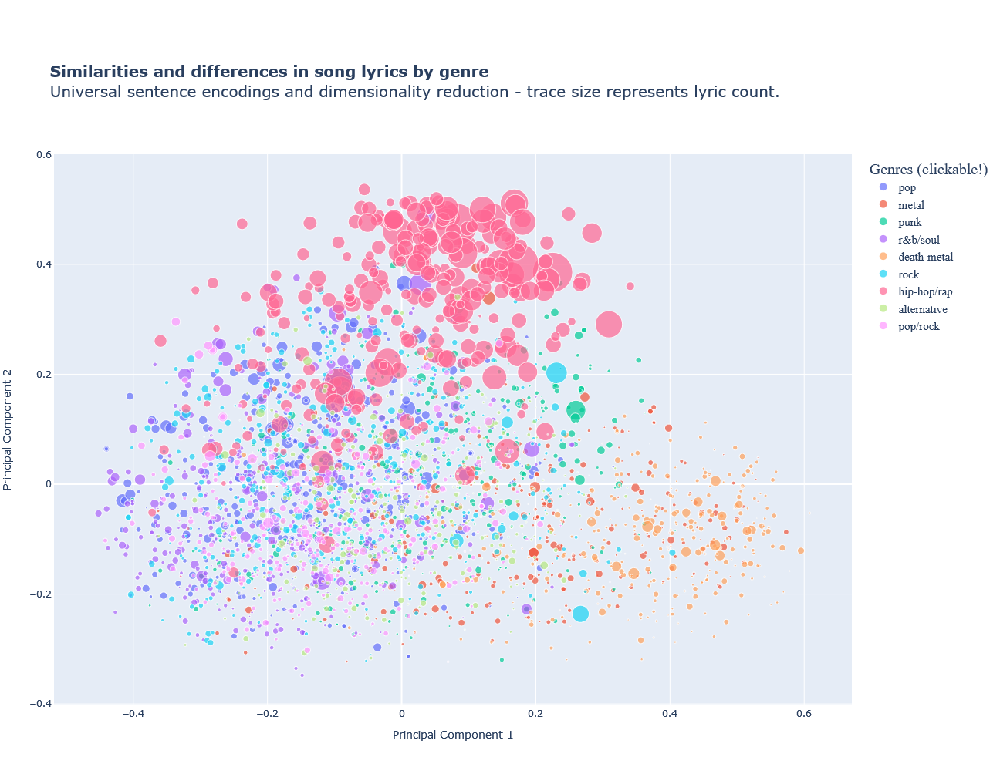

In [55]:
scatPlot_2 = Musixmatch_scatPlot(df,df_embed,n_components=2)

[0.07292866 0.11527746 0.14892869]


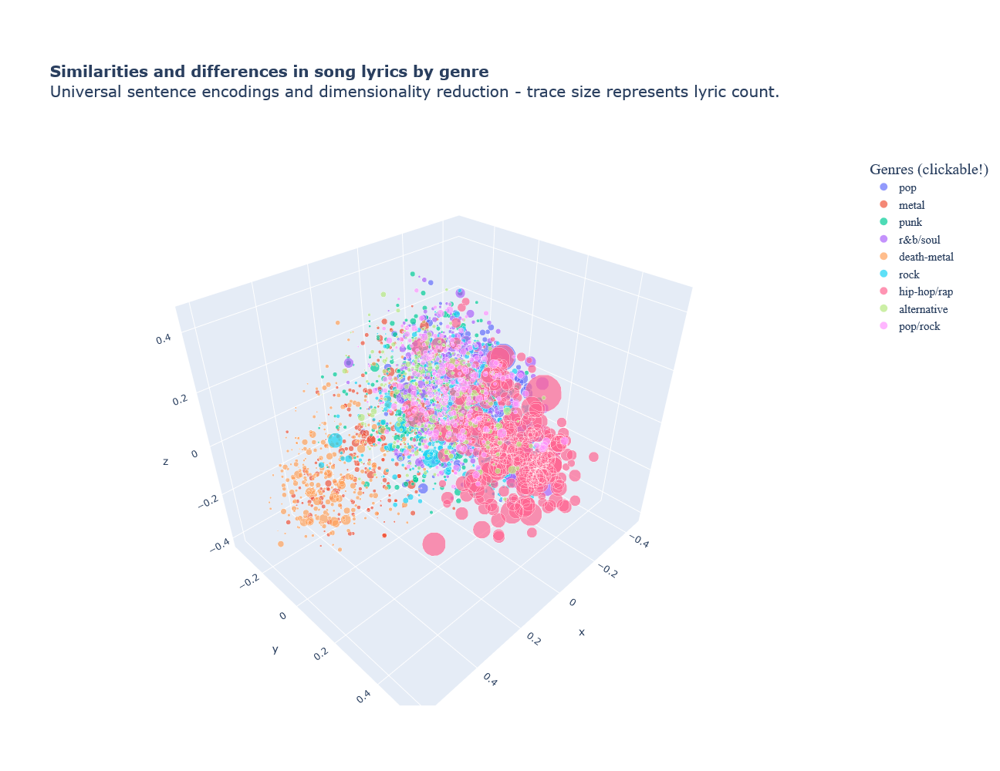

In [56]:
scatPlot_3 = Musixmatch_scatPlot(df,df_embed,n_components=3)

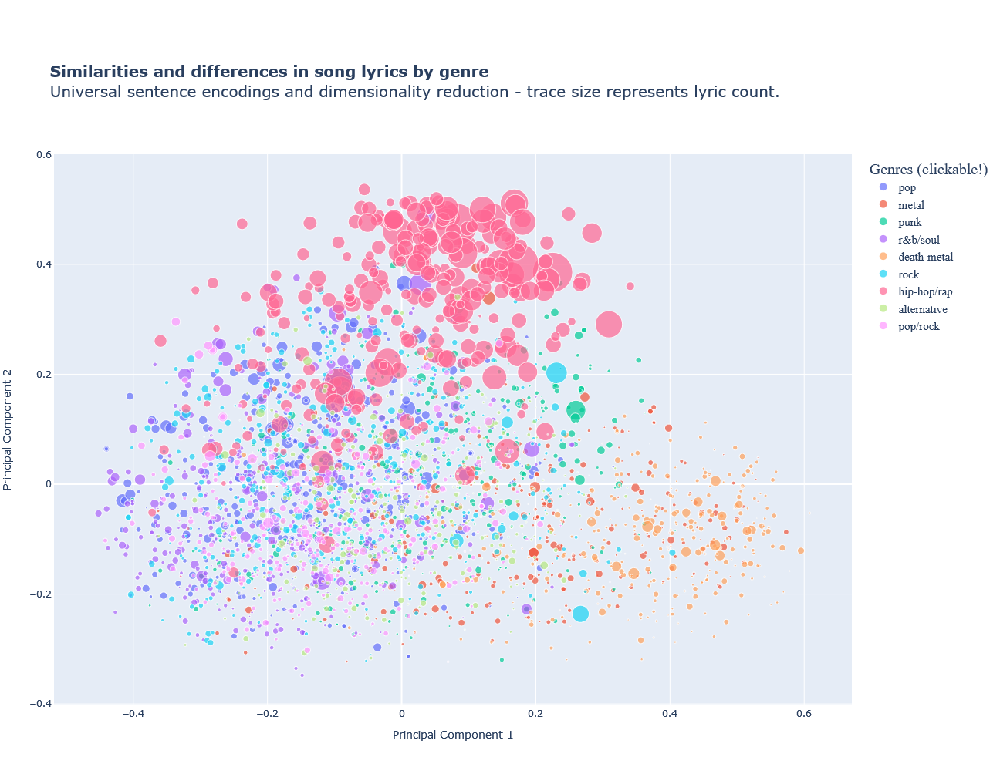

In [57]:
scatPlot_2